<a href="https://colab.research.google.com/github/KarlaDonza/MegaSena/blob/master/megasena.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Importação de bibliotecas e Dados** 

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.cluster import KMeans

In [0]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

In [3]:
from google.colab import drive
drive.mount('/content/drive/')
%cd /content/drive/'My Drive/Loterias'
%ls

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/
/content/drive/My Drive/Loterias
convertcsv.csv  interacoes.html  Profile.html  sena.html  your_report.html


In [0]:
results = pd.read_csv('convertcsv.csv')

##**Limpeza dos dados**






### *Verificando a Consistencia dos dados*

In [0]:
cons = pd.DataFrame({'colunas' : results.columns,
                    'tipo': results.dtypes,
                    'missing' : results.isna().sum(),
                    'size' : results.shape[0],
                  'unicos': results.nunique()})
cons['percentual'] = round(cons['missing'] / cons['size'],2)

In [6]:
print('Contagem de colunas com ATÉ 80% de dados faltantes', cons[cons.percentual <= 0.8].shape[0])
print('Contagem de colunas com 0% de dados faltantes',  cons[cons.percentual == 0].shape[0])
cons['completa'] = ['completa' if x == 0 else 'faltante' for x in cons['percentual']]
cons['oitenta'] = ['oitenta' if x <= 0.80 else 'remover' for x in cons['percentual']]
mantem = list(cons[cons['oitenta'] == 'oitenta']['colunas'])
results_clean = results[mantem]

Contagem de colunas com ATÉ 80% de dados faltantes 20
Contagem de colunas com 0% de dados faltantes 19


In [7]:
print(results.head(10))
cons

   Concurso Data Sorteio  ...  Estimativa_Pr�mio  Acumulado_Mega_da_Virada
0         1   11/03/1996  ...                  0                         0
1         2   18/03/1996  ...                  0                         0
2         3   25/03/1996  ...                  0                         0
3         4   01/04/1996  ...                  0                         0
4         5   08/04/1996  ...                  0                         0
5         6   15/04/1996  ...                  0                         0
6         7   22/04/1996  ...                  0                         0
7         8   29/04/1996  ...                  0                         0
8         9   06/05/1996  ...                  0                         0
9        10   13/05/1996  ...                  0                         0

[10 rows x 21 columns]


,colunas,tipo,missing,size,unicos,percentual,completa,oitenta
Concurso,Concurso,int64,0,2219,2219,0.00,completa,oitenta
Data Sorteio,Data Sorteio,object,0,2219,2219,0.00,completa,oitenta
1 Dezena,1 Dezena,int64,0,2219,60,0.00,completa,oitenta
2 Dezena,2 Dezena,int64,0,2219,60,0.00,completa,oitenta
3 Dezena,3 Dezena,int64,0,2219,60,0.00,completa,oitenta
4 Dezena,4 Dezena,int64,0,2219,60,0.00,completa,oitenta
5 Dezena,5 Dezena,int64,0,2219,60,0.00,completa,oitenta
6 Dezena,6 Dezena,int64,0,2219,60,0.00,completa,oitenta
Arrecadacao_Total,Arrecadacao_Total,object,0,2219,1150,0.00,completa,oitenta
Ganhadores_Sena,Ganhadores_Sena,int64,0,2219,11,0.00,completa,oitenta


In [0]:
results_clean = results.copy()

In [0]:
results_clean = results_clean.drop([ 'Cidade', 'UF'],axis = 1)

In [10]:
print(results_clean.describe())
porData = results_clean.drop([ 'Concurso', 'Arrecadacao_Total',
       'Ganhadores_Sena', 'Rateio_Sena', 'Ganhadores_Quina', 'Rateio_Quina',
       'Ganhadores_Quadra', 'Rateio_Quadra', 'Acumulado', 'Valor_Acumulado',
       'Estimativa_Pr�mio', 'Acumulado_Mega_da_Virada'],axis = 1)
porData['mesAno'] = pd.to_numeric(porData['Data Sorteio'].str.replace('/', '').str[2:8],errors='coerce',downcast='integer')
porData = porData.set_index('Data Sorteio')
print(porData.index)
print(porData.filter(like='2019', axis=0))
print(porData['mesAno'].value_counts())
data2019 = porData.filter(like='2019', axis=0)


          Concurso     1 Dezena  ...  Ganhadores_Quadra  Estimativa_Pr�mio
count  2219.000000  2219.000000  ...        2219.000000       2.219000e+03
mean   1110.000000    30.561064  ...        7298.292925       1.393795e+07
std     640.714445    17.315360  ...       10801.776762       2.675075e+07
min       1.000000     1.000000  ...         683.000000       0.000000e+00
25%     555.500000    16.000000  ...        3807.500000       0.000000e+00
50%    1110.000000    31.000000  ...        5453.000000       3.000000e+06
75%    1664.500000    46.000000  ...        7842.500000       2.000000e+07
max    2219.000000    60.000000  ...      303857.000000       3.000000e+08

[8 rows x 11 columns]
Index(['11/03/1996', '18/03/1996', '25/03/1996', '01/04/1996', '08/04/1996',
       '15/04/1996', '22/04/1996', '29/04/1996', '06/05/1996', '13/05/1996',
       ...
       '23/11/2019', '27/11/2019', '30/11/2019', '04/12/2019', '07/12/2019',
       '11/12/2019', '14/12/2019', '17/12/2019', '19/12/2019

In [49]:
print(data2019.head(15))
data2019.columns = ['D1','D2','D3','D4','D5','D6','mesAno']
data2019.rename({'1 Dezena': 'D1',
                 '2 Dezena': 'D2',
                 '3 Dezena': 'D3',
                 '4 Dezena': 'D4',
                 '5 Dezena': 'D5',
                 '6 Dezena': 'D6'}, axis=1, inplace=True)
print(data2019.columns)
data2019.set_index('mesAno')
jan2019 = data2019[data2019['mesAno'] == 12019 ]
fev2019 = data2019[data2019['mesAno'] == 22019 ]
mar2019 = data2019[data2019['mesAno'] == 32019 ]
abr2019 = data2019[data2019['mesAno'] == 42019 ]
mai2019 = data2019[data2019['mesAno'] == 52019 ]
jun2019 = data2019[data2019['mesAno'] == 62019 ]
jul2019 = data2019[data2019['mesAno'] == 72019 ]
ago2019 = data2019[data2019['mesAno'] == 82019 ]
set2019 = data2019[data2019['mesAno'] == 92019 ]
out2019 = data2019[data2019['mesAno'] == 102019 ]
nov2019 = data2019[data2019['mesAno'] == 112019 ]
dez2019 = data2019[data2019['mesAno'] == 122019 ]


              D1  D2  D3  D4  D5  D6  mesAno
Data Sorteio                                
02/01/2019    54  41   1  46  58  44   12019
05/01/2019    17  46  43  53  52  39   12019
09/01/2019    11  21  46  14  25  50   12019
12/01/2019    35  17  30  25  42  57   12019
15/01/2019    19  40  35  44  27   4   12019
17/01/2019    21  19   1   9  34  54   12019
19/01/2019    28  43   4  29  52  30   12019
23/01/2019    41  11  12  46  20  40   12019
26/01/2019    42  49  26  31  19  21   12019
30/01/2019    38  41  20  24  25  13   12019
02/02/2019    37   8  17  29  10  40   22019
06/02/2019    27  21   3  11  15  49   22019
09/02/2019    47  59  14  56  50  15   22019
13/02/2019    31  20  47  43   2  11   22019
16/02/2019    44   1  31  53  46  58   22019
Index(['D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'mesAno'], dtype='object')


In [123]:
balls_jan = jan2019[['D1','D2','D3','D4','D5','D6']]
balls_fev = fev2019[['D1','D2','D3','D4','D5','D6']]
balls_mar = mar2019[['D1','D2','D3','D4','D5','D6']]
balls_abr = abr2019[['D1','D2','D3','D4','D5','D6']]
balls_mai = mai2019[['D1','D2','D3','D4','D5','D6']]
balls_jun = jun2019[['D1','D2','D3','D4','D5','D6']]
balls_jul = jul2019[['D1','D2','D3','D4','D5','D6']]
balls_ago = ago2019[['D1','D2','D3','D4','D5','D6']]
balls_set = set2019[['D1','D2','D3','D4','D5','D6']]
balls_out = out2019[['D1','D2','D3','D4','D5','D6']]
balls_nov = nov2019[['D1','D2','D3','D4','D5','D6']]
balls_dez = dez2019[['D1','D2','D3','D4','D5','D6']]


d ={'Jan' : balls_jan.values.flatten(),
    'Fev' : balls_fev.values.flatten(),
    'Mar' : balls_mar.values.flatten(),
    'Abr' : balls_abr.values.flatten(),
    'Mai' : balls_mai.values.flatten(),
    'Jun' : balls_jun.values.flatten(),
    'Jul' : balls_jul.values.flatten(),
    'Ago' : balls_ago.values.flatten(),
    'Set' : balls_set.values.flatten(),
    'Out' : balls_out.values.flatten(),
    'Nov' : balls_nov.values.flatten(),
    'Dez' : balls_dez.values.flatten(),
    }

max2019 = pd.DataFrame(data=d)

df = pd.DataFrame.from_dict(d, orient='index')
df.transpose()
print(max2019)
print(fev_agg.total.value_counts())
print(mar_agg.total.value_counts())
print(abr_agg.total.value_counts())
print(mai_agg.total.value_counts())
balls_count = balls_agg.total.value_counts(sort=True).to_frame().reset_index()
print(balls_count)
f, ax = plt.subplots(figsize=(6, 25))
sns.barplot(y='index', x='total', data=balls_count, order = balls_count['index'], label="Total", orient='h', color='g')


ax.set(xlim=(0, 250), ylabel="", xlabel="Quantidade de vezes que a dezena foi sorteada janeiro 2019")
sns.despine(left=True, bottom=True)

ValueError: ignored

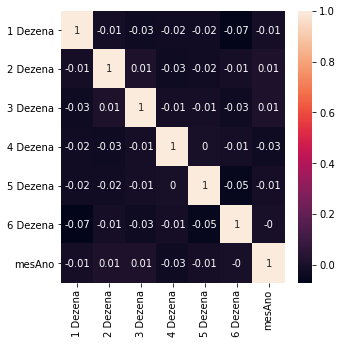

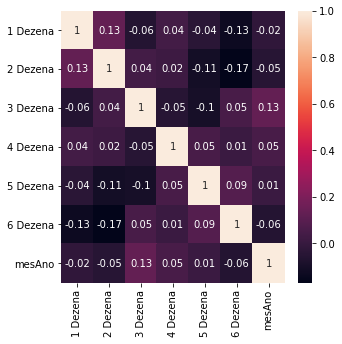

In [12]:
plt.figure(figsize = (5,5))
sns.heatmap(porData.corr().round(2), annot= True)
plt.figure(figsize = (5,5))
sns.heatmap(data2019.corr().round(2), annot= True)

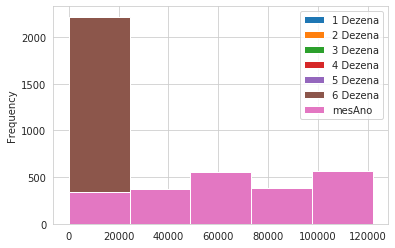

In [13]:
sns.set_style('whitegrid')
porData.plot.hist( bins = 5)



##pandas profiling




In [14]:
!pip -q install -U pandas-profiling

     |████████████████████████████████| 194kB 3.5MB/s 
     |████████████████████████████████| 614kB 66.2MB/s 
     |████████████████████████████████| 1.5MB 69.7MB/s 
     |████████████████████████████████| 61kB 9.4MB/s 
     |████████████████████████████████| 61kB 9.6MB/s 
     |████████████████████████████████| 235kB 63.8MB/s 
     |████████████████████████████████| 307kB 51.2MB/s 
     |████████████████████████████████| 51kB 7.8MB/s 
     |████████████████████████████████| 215kB 59.2MB/s 
     |████████████████████████████████| 61kB 7.5MB/s 
     |████████████████████████████████| 747kB 45.1MB/s 
ERROR: google-colab 1.0.0 has requirement requests~=2.21.0, but you'll have requests 2.22.0 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.


In [0]:
from pandas_profiling import ProfileReport

In [16]:
profile = ProfileReport(results, title='Pandas Profiling Report', html={'style':{'full_width':True}})
profile.to_file(output_file="sena.html")
profile.to_notebook_iframe()

##Ocorrencias


In [17]:
results['D1'] = results['1 Dezena']
results['D2'] = results['2 Dezena']
results['D3'] = results['3 Dezena']
results['D4'] = results['4 Dezena']
results['D5'] = results['5 Dezena']
results['D6'] = results['6 Dezena']
print(results.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2219 entries, 0 to 2218
Data columns (total 27 columns):
Concurso                    2219 non-null int64
Data Sorteio                2219 non-null object
1 Dezena                    2219 non-null int64
2 Dezena                    2219 non-null int64
3 Dezena                    2219 non-null int64
4 Dezena                    2219 non-null int64
5 Dezena                    2219 non-null int64
6 Dezena                    2219 non-null int64
Arrecadacao_Total           2219 non-null object
Ganhadores_Sena             2219 non-null int64
Cidade                      288 non-null object
UF                          490 non-null object
Rateio_Sena                 2219 non-null object
Ganhadores_Quina            2219 non-null int64
Rateio_Quina                2219 non-null object
Ganhadores_Quadra           2219 non-null int64
Rateio_Quadra               2219 non-null object
Acumulado                   2219 non-null object
Valor_Acumulado        

10    255
53    253
5     245
23    243
33    241
4     240
54    240
24    239
42    238
51    237
28    235
37    234
34    234
27    233
43    233
44    233
16    232
17    232
30    231
36    231
52    228
56    228
32    228
13    228
6     228
29    226
11    226
2     226
35    226
41    225
50    225
8     225
38    224
18    223
49    221
1     221
12    220
46    220
59    220
45    216
58    215
47    214
19    212
40    212
20    210
31    209
25    208
7     208
39    206
14    206
57    204
60    204
48    203
3     202
15    199
9     197
22    197
21    196
55    188
26    181
Name: total, dtype: int64
    index  total
0      10    255
1      53    253
2       5    245
3      23    243
4      33    241
5       4    240
6      54    240
7      24    239
8      42    238
9      51    237
10     28    235
11     37    234
12     34    234
13     27    233
14     43    233
15     44    233
16     16    232
17     17    232
18     30    231
19     36    231
20     52    228


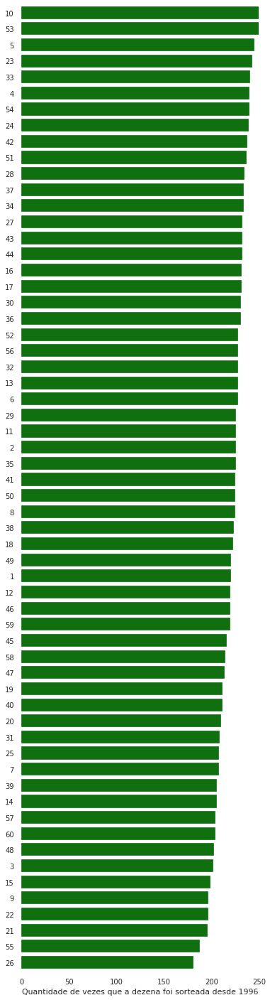

In [18]:
balls = results[['D1','D2','D3','D4','D5','D6']]
balls_agg = pd.DataFrame( balls.values.flatten(), columns=['total'] )
balls_agg.set_index('total')
print(balls_agg.total.value_counts())
balls_count = balls_agg.total.value_counts(sort=True).to_frame().reset_index()
print(balls_count)
f, ax = plt.subplots(figsize=(6, 25))

sns.barplot(y='index', x='total', data=balls_count, order = balls_count['index'], label="Total", orient='h', color='g')


ax.set(xlim=(0, 250), ylabel="", xlabel="Quantidade de vezes que a dezena foi sorteada desde 1996")
sns.despine(left=True, bottom=True)





##https://anaconda.org/ikkebr/megasena/notebook

In [19]:
from itertools import combinations
from collections import defaultdict
pair_list = defaultdict(lambda: 0, [])
    
for values in balls.iterrows():
    for k in combinations(values[1], 2):
        pair_list[k] += 1
        #pair_list[k[::-1]] += 1
    
print(pair_list)
pairs = pd.DataFrame(list(pair_list.items()), columns=['dezenas', 'total'] )
print(pairs.head(10))
new_col_list = ['d1','d2']
for n,col in enumerate(new_col_list):
    pairs[col] = pairs['dezenas'].apply(lambda dezena: dezena[n])

profile = ProfileReport(pairs, title='Pandas Profiling Report', html={'style':{'full_width':True}})
profile.to_file(output_file="interacoes.html")
profile.to_notebook_iframe()
pairs[['d1','d2','total']].sort_values('total', ascending=False)[:20]

defaultdict(<function <lambda> at 0x7fcc45ada488>, {(41, 5): 9, (41, 4): 8, (41, 52): 11, (41, 30): 12, (41, 33): 11, (5, 4): 14, (5, 52): 10, (5, 30): 13, (5, 33): 20, (4, 52): 14, (4, 30): 15, (4, 33): 16, (52, 30): 10, (52, 33): 11, (30, 33): 13, (9, 39): 6, (9, 37): 11, (9, 49): 9, (9, 43): 8, (9, 41): 18, (39, 37): 14, (39, 49): 8, (39, 43): 11, (39, 41): 8, (37, 49): 9, (37, 43): 15, (37, 41): 12, (49, 43): 11, (49, 41): 10, (43, 41): 5, (36, 30): 12, (36, 10): 12, (36, 11): 8, (36, 29): 17, (36, 47): 7, (30, 10): 13, (30, 11): 16, (30, 29): 7, (30, 47): 16, (10, 11): 12, (10, 29): 8, (10, 47): 15, (11, 29): 8, (11, 47): 8, (29, 47): 15, (6, 59): 9, (6, 42): 8, (6, 27): 6, (6, 1): 6, (6, 5): 14, (59, 42): 19, (59, 27): 10, (59, 1): 11, (59, 5): 13, (42, 27): 16, (42, 1): 7, (42, 5): 8, (27, 1): 11, (27, 5): 16, (1, 5): 12, (1, 19): 12, (1, 46): 14, (1, 6): 19, (1, 16): 10, (1, 2): 7, (19, 46): 5, (19, 6): 14, (19, 16): 9, (19, 2): 9, (46, 6): 14, (46, 16): 12, (46, 2): 8, (6, 16)

,d1,d2,total
1109,11,5,21
752,35,2,20
166,20,16,20
8,5,33,20
2141,18,30,20
1022,51,23,20
62,1,6,19
665,2,50,19
2836,31,34,19
304,53,36,19
